In [12]:
library(tidyverse)
library(readr)
library(scales)
library(caret)
library(stats)
library(dplyr)


# Read the CSV file into a dataframe
data <- read_csv('Spotify_data_combined.csv')
data

# Drop duplicates
data <- distinct(data)
data

# Remove the rows where "popularity" equals 0
data <- data %>% filter(popularity != 0)
data

# Replace missing values with the mean of the respective feature
data <- data %>% mutate_all(funs(ifelse(is.na(.), mean(., na.rm = TRUE), .)))
data

data$duration_ms <- data$duration_ms / 60000

# Calculate the first quartile (Q1), third quartile (Q3), and interquartile range (IQR) for 'duration_ms'
q1 <- quantile(data$duration_ms, 0.25)
q3 <- quantile(data$duration_ms, 0.75)
iqr <- q3 - q1

# Calculate the threshold
threshold <- q3 + 1.5 * iqr
threshold

# Filter the dataset to keep only the rows where 'duration_ms' is less than or equal to the threshold
data <- data[data$duration_ms <= threshold,]

# Reset the index of the filtered dataset
row.names(data) <- NULL



Rows: 20000 Columns: 17
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (3): artist_name, track_id, track_name
dbl (14): acousticness, danceability, duration_ms, energy, instrumentalness,...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


artist_name,track_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Johann Sebastian Bach,5zv1NaJZlrvudh6kXiW00C,"Sonata No. 3 for Violin & Harpsichord in E Major, BWV 1016: II. Allegro",8.64e-01,0.5550,160173,0.4270,1.06e-04,1,0.1600,-16.255,0,0.0406,114.188,4,0.8110,5
Toosii,0i6asO8kl8qUAXXRgpuRxi,Karma,1.04e-02,0.6190,197721,0.6600,0.00e+00,5,0.0995,-7.797,0,0.1180,140.022,4,0.3050,0
Drew Jacobs,764Kcf1Ac6QikkIiL7WUb8,Die a Happy Man,7.25e-01,0.5020,229608,0.4040,1.41e-06,2,0.1470,-7.011,1,0.0294,165.922,4,0.2420,22
Kareemulla,7zj67UIFjmhha66BhqXGIS,Udayinche Suryudila,1.38e-01,0.5800,182349,0.7600,0.00e+00,11,0.0769,-5.792,0,0.0517,171.731,4,0.3980,0
Johann Sebastian Bach,2vO5wNNXjXU28OWp5gyHEO,"Unaccompanied Cello Suite No. 2 in D Minor, BWV 1008: I. Prélude",9.63e-01,0.1990,252613,0.0356,9.37e-01,2,0.1100,-25.100,0,0.0564,94.771,4,0.1800,40
Jenni Rivera,4KS9SbrwuJYHScdMEOZEah,Las Cuentas Claras,7.84e-01,0.5810,206440,0.3010,3.95e-05,11,0.1710,-6.337,1,0.0518,88.546,4,0.6110,39
Mr. 2Kay,668L4NGvAN8ALuZOslHVmM,Your Body,1.46e-01,0.8260,217731,0.8210,0.00e+00,9,0.1860,-3.894,0,0.0928,107.026,4,0.9330,6
Strick,0Lav3mtSegjJgm8GnRh4QA,Love Lost (feat. Young Thug),6.93e-02,0.7810,233627,0.6980,1.10e-03,2,0.1560,-5.297,1,0.1850,75.008,4,0.4200,19
MO3,5kaq5PuVolNgv2VK7sIrZh,Right Now,2.40e-01,0.8450,224938,0.5940,0.00e+00,5,0.0956,-5.384,0,0.2930,132.094,4,0.8600,0


artist_name,track_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Johann Sebastian Bach,5zv1NaJZlrvudh6kXiW00C,"Sonata No. 3 for Violin & Harpsichord in E Major, BWV 1016: II. Allegro",8.64e-01,0.5550,160173,0.4270,1.06e-04,1,0.1600,-16.255,0,0.0406,114.188,4,0.8110,5
Toosii,0i6asO8kl8qUAXXRgpuRxi,Karma,1.04e-02,0.6190,197721,0.6600,0.00e+00,5,0.0995,-7.797,0,0.1180,140.022,4,0.3050,0
Drew Jacobs,764Kcf1Ac6QikkIiL7WUb8,Die a Happy Man,7.25e-01,0.5020,229608,0.4040,1.41e-06,2,0.1470,-7.011,1,0.0294,165.922,4,0.2420,22
Kareemulla,7zj67UIFjmhha66BhqXGIS,Udayinche Suryudila,1.38e-01,0.5800,182349,0.7600,0.00e+00,11,0.0769,-5.792,0,0.0517,171.731,4,0.3980,0
Johann Sebastian Bach,2vO5wNNXjXU28OWp5gyHEO,"Unaccompanied Cello Suite No. 2 in D Minor, BWV 1008: I. Prélude",9.63e-01,0.1990,252613,0.0356,9.37e-01,2,0.1100,-25.100,0,0.0564,94.771,4,0.1800,40
Jenni Rivera,4KS9SbrwuJYHScdMEOZEah,Las Cuentas Claras,7.84e-01,0.5810,206440,0.3010,3.95e-05,11,0.1710,-6.337,1,0.0518,88.546,4,0.6110,39
Mr. 2Kay,668L4NGvAN8ALuZOslHVmM,Your Body,1.46e-01,0.8260,217731,0.8210,0.00e+00,9,0.1860,-3.894,0,0.0928,107.026,4,0.9330,6
Strick,0Lav3mtSegjJgm8GnRh4QA,Love Lost (feat. Young Thug),6.93e-02,0.7810,233627,0.6980,1.10e-03,2,0.1560,-5.297,1,0.1850,75.008,4,0.4200,19
MO3,5kaq5PuVolNgv2VK7sIrZh,Right Now,2.40e-01,0.8450,224938,0.5940,0.00e+00,5,0.0956,-5.384,0,0.2930,132.094,4,0.8600,0


artist_name,track_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Johann Sebastian Bach,5zv1NaJZlrvudh6kXiW00C,"Sonata No. 3 for Violin & Harpsichord in E Major, BWV 1016: II. Allegro",8.64e-01,0.5550,160173,0.4270,1.06e-04,1,0.1600,-16.255,0,0.0406,114.188,4,0.8110,5
Drew Jacobs,764Kcf1Ac6QikkIiL7WUb8,Die a Happy Man,7.25e-01,0.5020,229608,0.4040,1.41e-06,2,0.1470,-7.011,1,0.0294,165.922,4,0.2420,22
Johann Sebastian Bach,2vO5wNNXjXU28OWp5gyHEO,"Unaccompanied Cello Suite No. 2 in D Minor, BWV 1008: I. Prélude",9.63e-01,0.1990,252613,0.0356,9.37e-01,2,0.1100,-25.100,0,0.0564,94.771,4,0.1800,40
Jenni Rivera,4KS9SbrwuJYHScdMEOZEah,Las Cuentas Claras,7.84e-01,0.5810,206440,0.3010,3.95e-05,11,0.1710,-6.337,1,0.0518,88.546,4,0.6110,39
Mr. 2Kay,668L4NGvAN8ALuZOslHVmM,Your Body,1.46e-01,0.8260,217731,0.8210,0.00e+00,9,0.1860,-3.894,0,0.0928,107.026,4,0.9330,6
Strick,0Lav3mtSegjJgm8GnRh4QA,Love Lost (feat. Young Thug),6.93e-02,0.7810,233627,0.6980,1.10e-03,2,0.1560,-5.297,1,0.1850,75.008,4,0.4200,19
Toad Gadget,0w8qUHWMcqKo2ZwlUGojNX,Kisses,5.10e-01,0.4910,72098,0.5360,7.46e-01,7,0.1330,-12.027,1,0.0686,119.888,3,0.2260,3
Johann Sebastian Bach,6oU7hj2dQDOdJUi1kGtFI4,"Trio Sonata No. 3, BWV 527: I. Allegro",8.60e-01,0.1630,288840,0.0150,9.78e-01,2,0.0875,-33.178,0,0.0406,134.356,4,0.2000,3
Senses Fail,1bbRM6nUzzoO6vhfNx9h3n,Elevator to the Gallows,1.69e-05,0.5470,224000,0.9570,0.00e+00,2,0.3830,-3.829,1,0.0510,109.986,4,0.4330,39


Warning message:
“`funs()` was deprecated in dplyr 0.8.0.
ℹ Please use a list of either functions or lambdas:

# Simple named list: list(mean = mean, median = median)

# Auto named with `tibble::lst()`: tibble::lst(mean, median)

# Using lambdas list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))”


artist_name,track_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Johann Sebastian Bach,5zv1NaJZlrvudh6kXiW00C,"Sonata No. 3 for Violin & Harpsichord in E Major, BWV 1016: II. Allegro",8.64e-01,0.5550,160173,0.4270,1.06e-04,1,0.1600,-16.255,0,0.0406,114.188,4,0.8110,5
Drew Jacobs,764Kcf1Ac6QikkIiL7WUb8,Die a Happy Man,7.25e-01,0.5020,229608,0.4040,1.41e-06,2,0.1470,-7.011,1,0.0294,165.922,4,0.2420,22
Johann Sebastian Bach,2vO5wNNXjXU28OWp5gyHEO,"Unaccompanied Cello Suite No. 2 in D Minor, BWV 1008: I. Prélude",9.63e-01,0.1990,252613,0.0356,9.37e-01,2,0.1100,-25.100,0,0.0564,94.771,4,0.1800,40
Jenni Rivera,4KS9SbrwuJYHScdMEOZEah,Las Cuentas Claras,7.84e-01,0.5810,206440,0.3010,3.95e-05,11,0.1710,-6.337,1,0.0518,88.546,4,0.6110,39
Mr. 2Kay,668L4NGvAN8ALuZOslHVmM,Your Body,1.46e-01,0.8260,217731,0.8210,0.00e+00,9,0.1860,-3.894,0,0.0928,107.026,4,0.9330,6
Strick,0Lav3mtSegjJgm8GnRh4QA,Love Lost (feat. Young Thug),6.93e-02,0.7810,233627,0.6980,1.10e-03,2,0.1560,-5.297,1,0.1850,75.008,4,0.4200,19
Toad Gadget,0w8qUHWMcqKo2ZwlUGojNX,Kisses,5.10e-01,0.4910,72098,0.5360,7.46e-01,7,0.1330,-12.027,1,0.0686,119.888,3,0.2260,3
Johann Sebastian Bach,6oU7hj2dQDOdJUi1kGtFI4,"Trio Sonata No. 3, BWV 527: I. Allegro",8.60e-01,0.1630,288840,0.0150,9.78e-01,2,0.0875,-33.178,0,0.0406,134.356,4,0.2000,3
Senses Fail,1bbRM6nUzzoO6vhfNx9h3n,Elevator to the Gallows,1.69e-05,0.5470,224000,0.9570,0.00e+00,2,0.3830,-3.829,1,0.0510,109.986,4,0.4330,39


75% 
5.923325

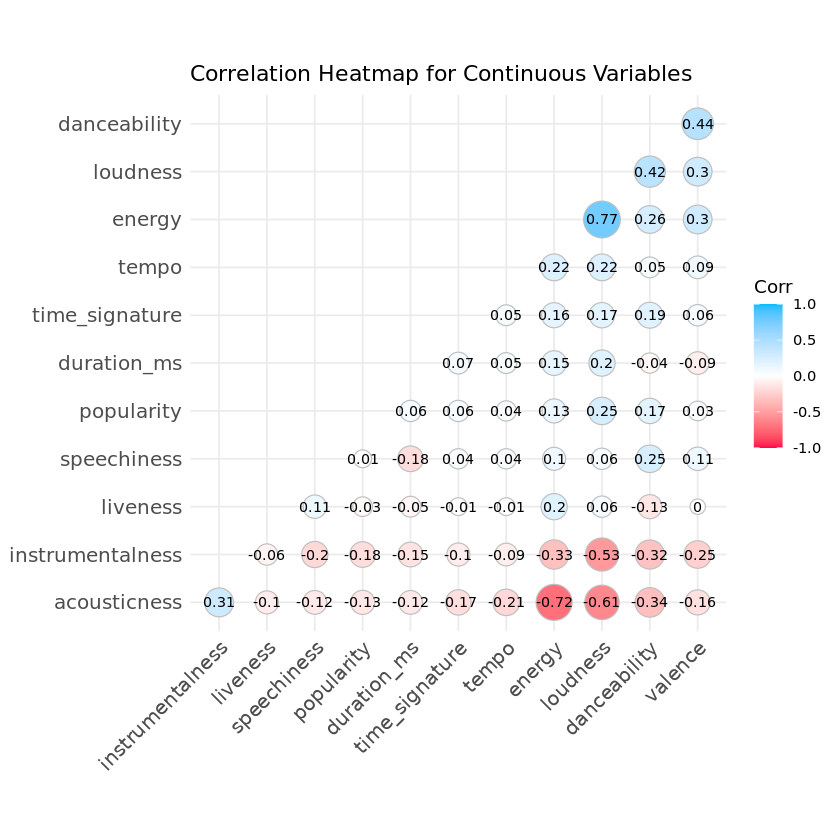

In [9]:
# Load required libraries
library(ggplot2)
library(ggcorrplot)

# Calculate the correlation matrix for continuous variables
continuous_vars <- c("popularity", "acousticness", "danceability", "duration_ms", "energy", "instrumentalness", "liveness", "loudness", "speechiness", "tempo", "time_signature", "valence")
corr_matrix <- cor(data[, continuous_vars])

# Plot the colorful correlation heatmap
heatmap <- ggcorrplot(corr_matrix, hc.order = TRUE, type = "lower", 
                      lab = TRUE, lab_size = 3, method = "circle", 
                      colors = c("#FF004D", "white", "#00BDFF"), 
                      title = "Correlation Heatmap for Continuous Variables", 
                      ggtheme = theme_minimal())

print(heatmap)


In [10]:
# Perform one-hot encoding on the 'key', 'mode', and 'time_signature' features
data$key <- as.factor(data$key)
key_one_hot <- model.matrix(~key - 1, data = data)
key_one_hot_df <- as.data.frame(key_one_hot)

data$mode <- as.factor(data$mode)
mode_one_hot <- model.matrix(~mode - 1, data = data)
mode_one_hot_df <- as.data.frame(mode_one_hot)

data$time_signature <- as.factor(data$time_signature)
time_signature_one_hot <- model.matrix(~time_signature - 1, data = data)
time_signature_one_hot_df <- as.data.frame(time_signature_one_hot)

# Combine the one-hot encoded columns with the original dataset
data_encoded <- cbind(data, key_one_hot_df, mode_one_hot_df, time_signature_one_hot_df)

# Remove the original 'key', 'mode', and 'time_signature' columns
data_encoded <- data_encoded[, !(colnames(data_encoded) %in% c("key", "mode", "time_signature"))]

# Continuous variables including the one-hot encoded columns and 'popularity'
continuous_vars <- c("popularity", "acousticness", "danceability", "duration_ms", "energy", "instrumentalness", "liveness", "loudness", "speechiness", "tempo", "valence", colnames(key_one_hot_df), colnames(mode_one_hot_df), colnames(time_signature_one_hot_df))

# Scale the continuous variables
scaled_data <- scale(data_encoded[, continuous_vars])

# Convert the scaled data to a data frame and rename the columns
df_scaled_std <- as.data.frame(scaled_data)
colnames(df_scaled_std) <- continuous_vars


corr_matrix <- cor(df_scaled_std)

corr_matrix

# calculate the Spearman correlation matrix
corr_matrix <- cor(df_scaled_std, method = "spearman")

corr_matrix

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,⋯,key9,key10,key11,mode0,mode1,time_signature0,time_signature1,time_signature3,time_signature4,time_signature5
popularity,1.000000000,-0.1283820991,0.173310339,0.0582520739,0.130174161,-0.1815396354,-0.0333704906,0.247816185,0.008036372,0.044576038,⋯,-1.962291e-02,-0.0048897178,0.031927174,0.0154461472,-0.0154461472,-0.023404785,-0.0335739580,-7.486286e-02,0.0951078128,-0.0374591137
acousticness,-0.128382099,1.0000000000,-0.340089655,-0.1219597283,-0.715945552,0.3134862770,-0.0994358480,-0.611981004,-0.117669928,-0.208329465,⋯,1.963684e-02,0.0039363257,-0.050440134,-0.0646283466,0.0646283466,0.002617634,0.0823132990,2.236203e-01,-0.2560183283,0.0787421205
danceability,0.173310339,-0.3400896548,1.000000000,-0.0391068950,0.261980584,-0.3242837843,-0.1293741854,0.424748567,0.252016278,0.049804900,⋯,-1.973136e-02,0.0096076293,0.040181783,0.0531776877,-0.0531776877,-0.112548482,-0.0843656091,-2.256747e-01,0.2818903130,-0.1049911164
duration_ms,0.058252074,-0.1219597283,-0.039106895,1.0000000000,0.146884112,-0.1505569514,-0.0491568528,0.200068766,-0.182783699,0.054204539,⋯,1.009915e-03,0.0030889242,0.002730796,0.0068503222,-0.0068503222,-0.035361920,-0.0711629834,-5.572830e-02,0.1121716178,-0.0810369544
energy,0.130174161,-0.7159455519,0.261980584,0.1468841125,1.000000000,-0.3321231404,0.1976205395,0.768049853,0.096367079,0.223401116,⋯,-1.734911e-03,-0.0053422439,0.051713263,0.0528925411,-0.0528925411,-0.058924033,-0.0764879474,-2.005781e-01,0.2421742676,-0.0832426764
instrumentalness,-0.181539635,0.3134862770,-0.324283784,-0.1505569514,-0.332123140,1.0000000000,-0.0556880830,-0.532564330,-0.202199366,-0.094121115,⋯,-1.813253e-03,-0.0002501619,-0.036267443,0.0100045157,-0.0100045157,0.039008139,0.0557966241,9.746667e-02,-0.1196977576,0.0286853756
liveness,-0.033370491,-0.0994358480,-0.129374185,-0.0491568528,0.197620540,-0.0556880830,1.0000000000,0.055618753,0.107319627,-0.013399792,⋯,1.078577e-02,-0.0059076078,0.013944670,0.0020145718,-0.0020145718,0.041829156,-0.0004769293,8.626761e-03,-0.0193668460,0.0170436112
loudness,0.247816185,-0.6119810043,0.424748567,0.2000687659,0.768049853,-0.5325643299,0.0556187530,1.000000000,0.061891355,0.216750053,⋯,-4.647668e-03,-0.0111365144,0.048866548,0.0248584256,-0.0248584256,-0.074055235,-0.0975391341,-1.968187e-01,0.2547136834,-0.0990277194
speechiness,0.008036372,-0.1176699280,0.252016278,-0.1827836990,0.096367079,-0.2021993662,0.1073196274,0.061891355,1.000000000,0.040600717,⋯,-1.743002e-02,0.0244710453,0.030130618,0.0521491826,-0.0521491826,-0.032385277,0.0099661323,-2.750234e-02,-0.0114750539,0.0779640638
tempo,0.044576038,-0.2083294647,0.049804900,0.0542045387,0.223401116,-0.0941211146,-0.0133997919,0.216750053,0.040600717,1.000000000,⋯,-1.723381e-03,-0.0110249071,0.009917603,-0.0048475910,0.0048475910,-0.140861151,-0.0346571017,1.299457e-02,0.0305686477,-0.0339490568


,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,⋯,key9,key10,key11,mode0,mode1,time_signature0,time_signature1,time_signature3,time_signature4,time_signature5
popularity,1.000000000,-0.099899701,0.154190317,0.0499074602,0.121758587,-0.1738804182,-0.0236031730,0.251618592,0.031186977,0.043864010,⋯,-1.978043e-02,-0.0046951697,0.031526894,0.0134001061,-0.0134001061,-0.023617621,-0.0354382779,-7.227553e-02,0.0949246881,-0.0405532303
acousticness,-0.099899701,1.000000000,-0.198424617,-0.1098589703,-0.663280680,0.1304979012,-0.1167058336,-0.513462896,-0.167394626,-0.219971493,⋯,2.170809e-02,0.0072164883,-0.048550297,-0.0539069932,0.0539069932,-0.001596323,0.0735817427,2.012722e-01,-0.2319518057,0.0755301317
danceability,0.154190317,-0.198424617,1.000000000,-0.0832434910,0.158082312,-0.2990850458,-0.1264144395,0.264081568,0.323379574,0.034317149,⋯,-2.179943e-02,0.0142543010,0.037628173,0.0577075294,-0.0577075294,-0.061724182,-0.0747798162,-2.134328e-01,0.2600138825,-0.0988406458
duration_ms,0.049907460,-0.109858970,-0.083243491,1.0000000000,0.132624699,-0.0671054035,-0.0404075897,0.152704540,-0.183651308,0.046122381,⋯,2.392642e-03,0.0006215836,0.008042018,0.0085813463,-0.0085813463,-0.027980896,-0.0567987702,-4.666791e-02,0.0915662668,-0.0650723395
energy,0.121758587,-0.663280680,0.158082312,0.1326246991,1.000000000,-0.2215650172,0.1813884748,0.762750355,0.214264494,0.211199431,⋯,-1.879287e-03,-0.0046252888,0.048147690,0.0473094764,-0.0473094764,-0.043958407,-0.0676140483,-1.812269e-01,0.2166457398,-0.0736891942
instrumentalness,-0.173880418,0.130497901,-0.299085046,-0.0671054035,-0.221565017,1.0000000000,-0.0461353746,-0.429490928,-0.282598172,-0.067513892,⋯,9.623432e-03,0.0001517865,-0.029270656,0.0176938618,-0.0176938618,0.027038482,0.0394546418,8.289203e-02,-0.0876750200,0.0004955942
liveness,-0.023603173,-0.116705834,-0.126414440,-0.0404075897,0.181388475,-0.0461353746,1.0000000000,0.072154060,0.071898482,0.005355739,⋯,-9.762148e-03,0.0064276484,0.016850433,0.0095473777,-0.0095473777,0.017283033,0.0001047491,3.593964e-03,-0.0130076910,0.0178412263
loudness,0.251618592,-0.513462896,0.264081568,0.1527045396,0.762750355,-0.4294909282,0.0721540600,1.000000000,0.129174004,0.185092460,⋯,-1.104307e-02,-0.0090820721,0.034437261,0.0133878517,-0.0133878517,-0.047511693,-0.0831368791,-1.656568e-01,0.2130677968,-0.0831080169
speechiness,0.031186977,-0.167394626,0.323379574,-0.1836513076,0.214264494,-0.2825981721,0.0718984817,0.129174004,1.000000000,0.093599546,⋯,-2.772939e-02,0.0248837046,0.032784956,0.0977495836,-0.0977495836,-0.061724159,-0.0019245306,-7.715040e-02,0.0473899391,0.0579571731
tempo,0.043864010,-0.219971493,0.034317149,0.0461223807,0.211199431,-0.0675138919,0.0053557393,0.185092460,0.093599546,1.000000000,⋯,-2.860694e-03,-0.0081396656,0.012998268,-0.0035146350,0.0035146350,-0.061724090,-0.0377261458,-3.901450e-04,0.0353175808,-0.0350825297


In [2]:

# Load required libraries
library(caret)
library(rpart)

# Set the seed for reproducibility
set.seed(42)

# Split the data into training and testing sets (80% train, 20% test)
split_indices <- createDataPartition(df_scaled_std$popularity, p = 0.8, list = FALSE)
X_train <- df_scaled_std[split_indices, -1]
y_train <- df_scaled_std$popularity[split_indices]

X_test <- df_scaled_std[-split_indices, -1]
y_test <- df_scaled_std$popularity[-split_indices]

# Define the control parameters for cross-validation
control <- trainControl(method = "cv", number = 10, savePredictions = "final")

# Train the Linear Regression model with cross-validation
model_lm_cv <- train(x = X_train, y = y_train, method = "lm", trControl = control)

# Make predictions on the testing data
y_pred_lm_cv <- predict(model_lm_cv, newdata = X_test)

# Evaluate the performance of the Linear Regression model
mse_lm_cv <- mean((y_test - y_pred_lm_cv)^2)
r2_lm_cv <- 1 - (sum((y_test - y_pred_lm_cv)^2) / sum((y_test - mean(y_test))^2))
adj_r2_lm_cv <- 1 - (((1 - r2_lm_cv) * (length(y_test) - 1)) / (length(y_test) - length(X_test) - 1))

# Print the evaluation metrics for the Linear Regression model
cat("Linear Regression\n")
cat("Mean Squared Error:", mse_lm_cv, "\n")
cat("R-squared:", r2_lm_cv, "\n")
cat("Adjusted R-squared:", adj_r2_lm_cv, "\n")
cat("\n")


Warning message in predict.lm(modelFit, newdata):
“prediction from a rank-deficient fit may be misleading”
Warning message in predict.lm(modelFit, newdata):
“prediction from a rank-deficient fit may be misleading”
Warning message in predict.lm(modelFit, newdata):
“prediction from a rank-deficient fit may be misleading”
Warning message in predict.lm(modelFit, newdata):
“prediction from a rank-deficient fit may be misleading”
Warning message in predict.lm(modelFit, newdata):
“prediction from a rank-deficient fit may be misleading”
Warning message in predict.lm(modelFit, newdata):
“prediction from a rank-deficient fit may be misleading”
Warning message in predict.lm(modelFit, newdata):
“prediction from a rank-deficient fit may be misleading”
Warning message in predict.lm(modelFit, newdata):
“prediction from a rank-deficient fit may be misleading”
Warning message in predict.lm(modelFit, newdata):
“prediction from a rank-deficient fit may be misleading”
Warning message in predict.lm(modelFi

Linear Regression
Mean Squared Error: 0.9195855 
R-squared: 0.0736586 
Adjusted R-squared: 0.06544585 



In [34]:



# Define the control parameters for cross-validation
control <- trainControl(method = "cv", number = 10, savePredictions = "final", search = "grid")

# Create a grid of tuning parameters for Ridge Regression (alpha = 0 for Ridge)
grid_ridge <- expand.grid(alpha = 0, lambda = seq(0.0001, 0.1, length.out = 20))

# Train the Ridge Regression model with cross-validation
model_ridge_cv <- train(x = X_train, y = y_train, method = "glmnet", trControl = control, tuneGrid = grid_ridge)

# Make predictions on the testing data
y_pred_ridge_cv <- predict(model_ridge_cv, newdata = X_test)

# Evaluate the performance of the Ridge Regression model
mse_ridge_cv <- mean((y_test - y_pred_ridge_cv)^2)
r2_ridge_cv <- 1 - (sum((y_test - y_pred_ridge_cv)^2) / sum((y_test - mean(y_test))^2))
adj_r2_ridge_cv <- 1 - (((1 - r2_ridge_cv) * (length(y_test) - 1)) / (length(y_test) - length(X_test) - 1))

# Print the evaluation metrics for the Ridge Regression model
cat("Ridge Regression\n")
cat("Mean Squared Error:", mse_ridge_cv, "\n")
cat("R-squared:", r2_ridge_cv, "\n")
cat("Adjusted R-squared:", adj_r2_ridge_cv, "\n")


Ridge Regression
Mean Squared Error: 0.9190945 
R-squared: 0.07415323 
Adjusted R-squared: 0.06594487 


In [35]:
# Install required packages
# install.packages("caret")
# install.packages("glmnet")

# Load required libraries
library(caret)
library(glmnet)

# Set the seed for reproducibility
set.seed(42)

# Define the control parameters for cross-validation
control <- trainControl(method = "cv", number = 10, savePredictions = "final", search = "grid")

# Create a grid of tuning parameters for Lasso Regression (alpha = 1 for Lasso)
grid_lasso <- expand.grid(alpha = 1, lambda = seq(0.0001, 0.1, length.out = 20))

# Convert the training data to a matrix format
X_train_matrix <- as.matrix(X_train)

# Train the Lasso Regression model with cross-validation
model_lasso_cv <- train(x = X_train_matrix, y = y_train, method = "glmnet", trControl = control, tuneGrid = grid_lasso)

# Make predictions on the testing data
y_pred_lasso_cv <- predict(model_lasso_cv, newdata = X_test)

# Evaluate the performance of the Lasso Regression model
mse_lasso_cv <- mean((y_test - y_pred_lasso_cv)^2)
r2_lasso_cv <- 1 - (sum((y_test - y_pred_lasso_cv)^2) / sum((y_test - mean(y_test))^2))
adj_r2_lasso_cv <- 1 - (((1 - r2_lasso_cv) * (length(y_test) - 1)) / (length(y_test) - length(X_test) - 1))

# Print the evaluation metrics for the Lasso Regression model
cat("Lasso Regression\n")
cat("Mean Squared Error:", mse_lasso_cv, "\n")
cat("R-squared:", r2_lasso_cv, "\n")
cat("Adjusted R-squared:", adj_r2_lasso_cv, "\n")


Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loaded glmnet 4.1-7



Lasso Regression
Mean Squared Error: 0.9193606 
R-squared: 0.07388515 
Adjusted R-squared: 0.06567441 


In [3]:
# Train the Decision Tree Regression model with cross-validation
model_dt_cv <- train(x = X_train, y = y_train, method = "rpart", trControl = control)

# Make predictions on the testing data
y_pred_dt_cv <- predict(model_dt_cv, newdata = X_test)

# Evaluate the performance of the Decision Tree Regression model
mse_dt_cv <- mean((y_test - y_pred_dt_cv)^2)
r2_dt_cv <- 1 - (sum((y_test - y_pred_dt_cv)^2) / sum((y_test - mean(y_test))^2))
adj_r2_dt_cv <- 1 - (((1 - r2_dt_cv) * (length(y_test) - 1)) / (length(y_test) - length(X_test) - 1))

# Print the evaluation metrics for the Decision Tree Regression model
cat("Decision Tree Regression\n")
cat("Mean Squared Error:", mse_dt_cv, "\n")
cat("R-squared:", r2_dt_cv, "\n")
cat("Adjusted R-squared:", adj_r2_dt_cv, "\n")

Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”


Decision Tree Regression
Mean Squared Error: 0.9361228 
R-squared: 0.05699978 
Adjusted R-squared: 0.04863934 


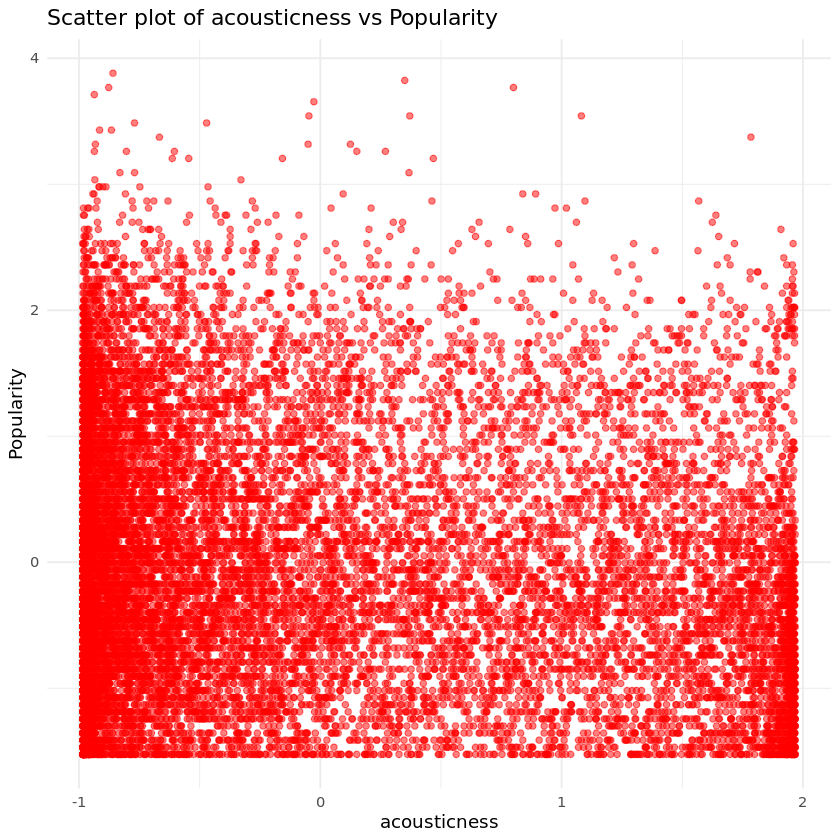

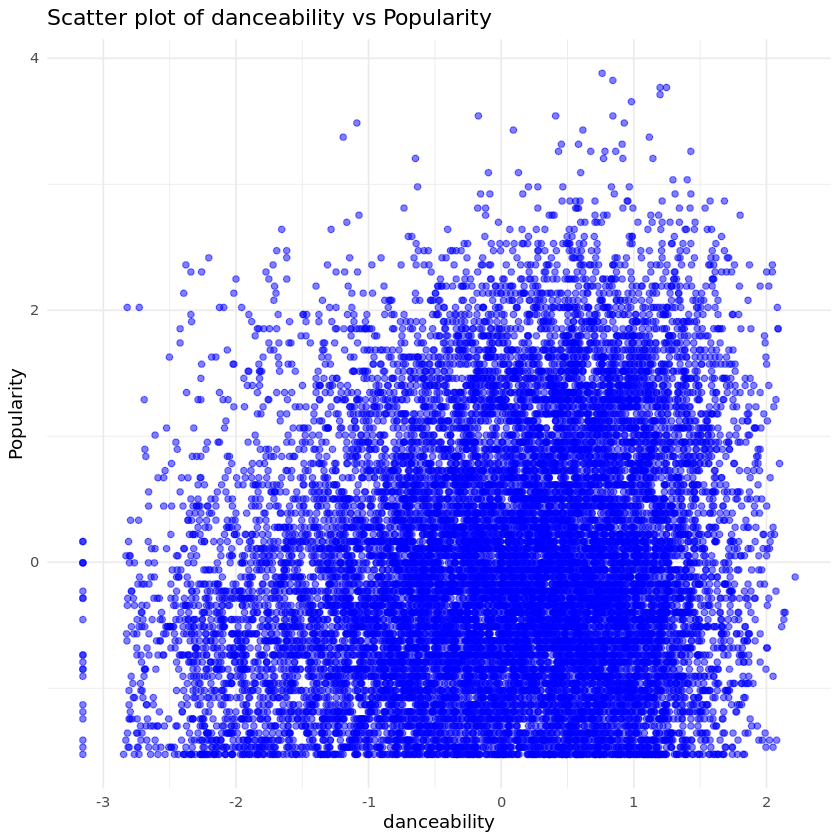

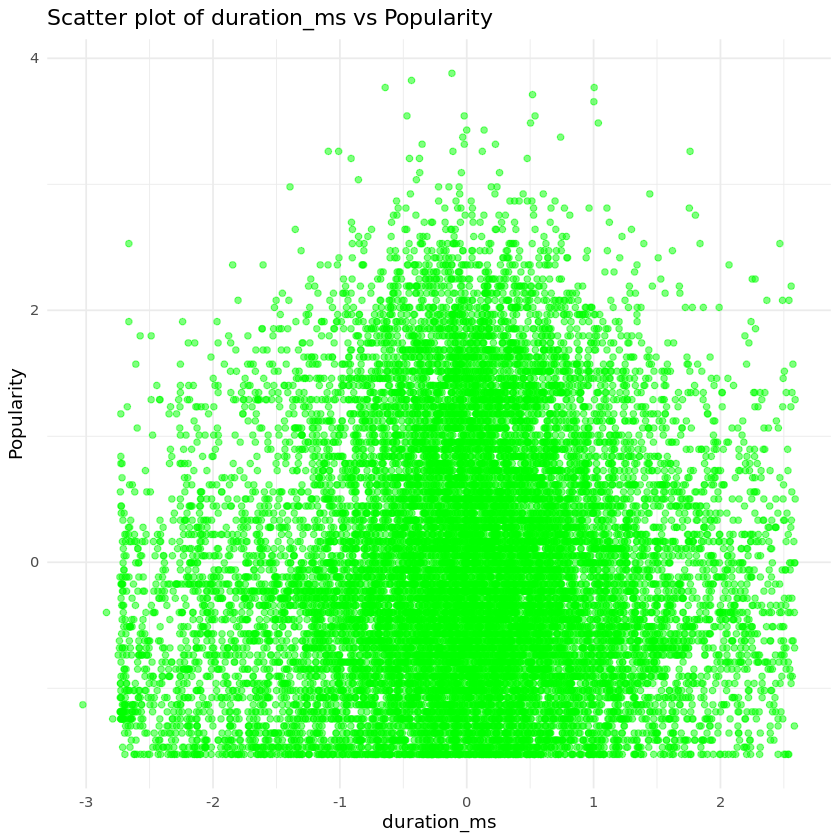

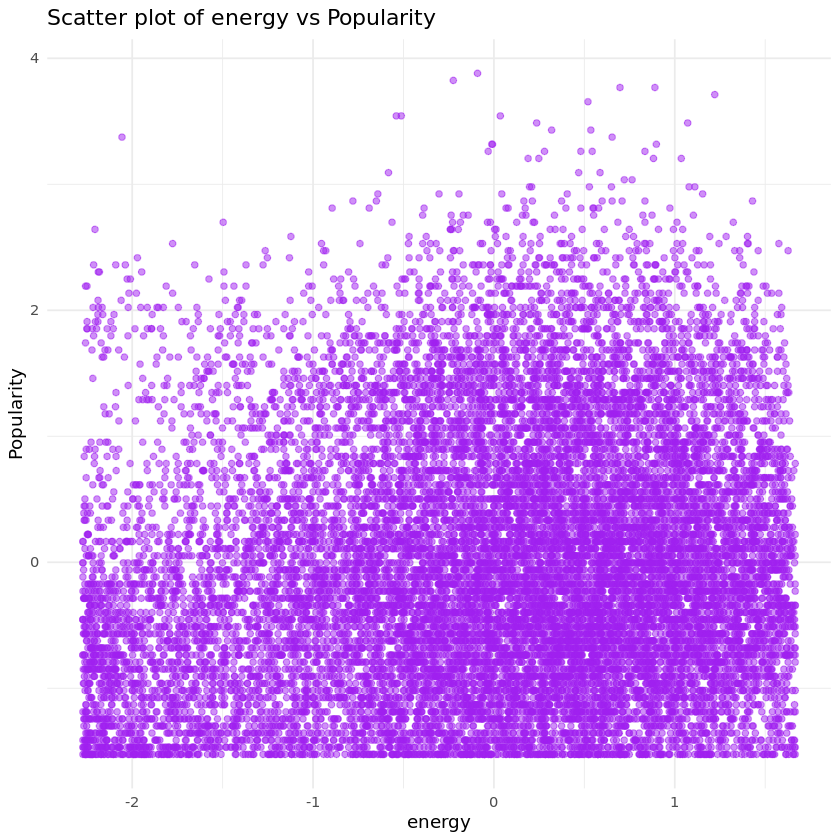

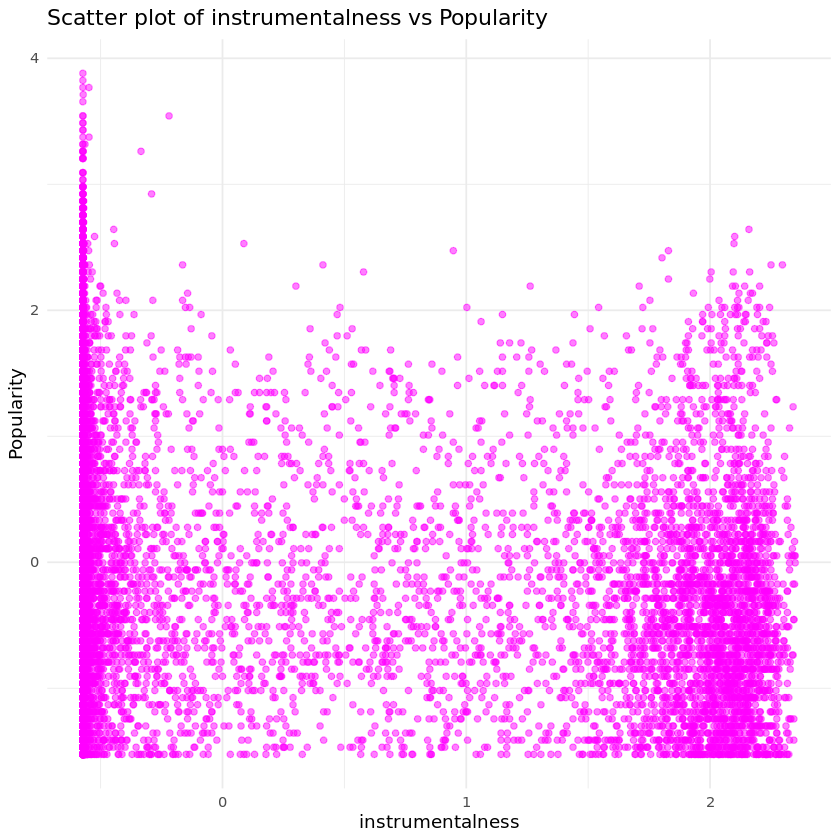

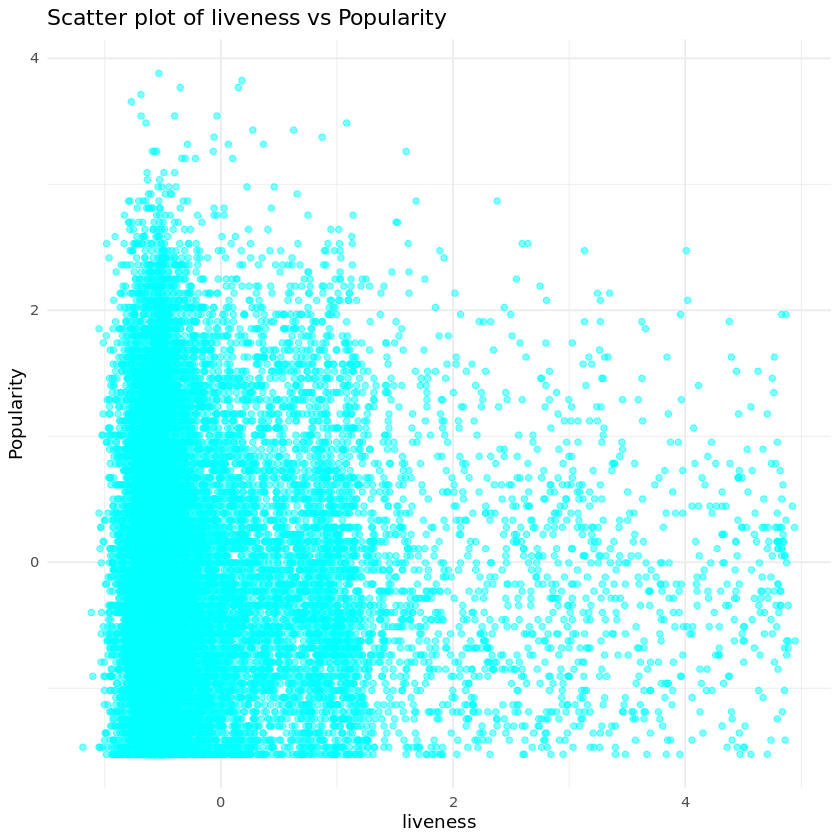

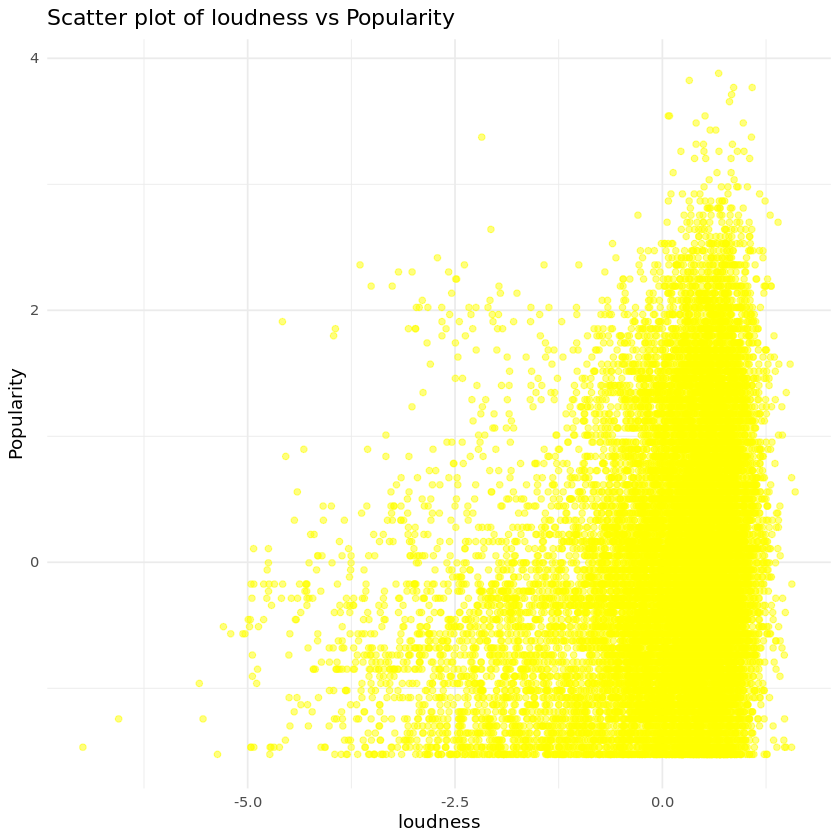

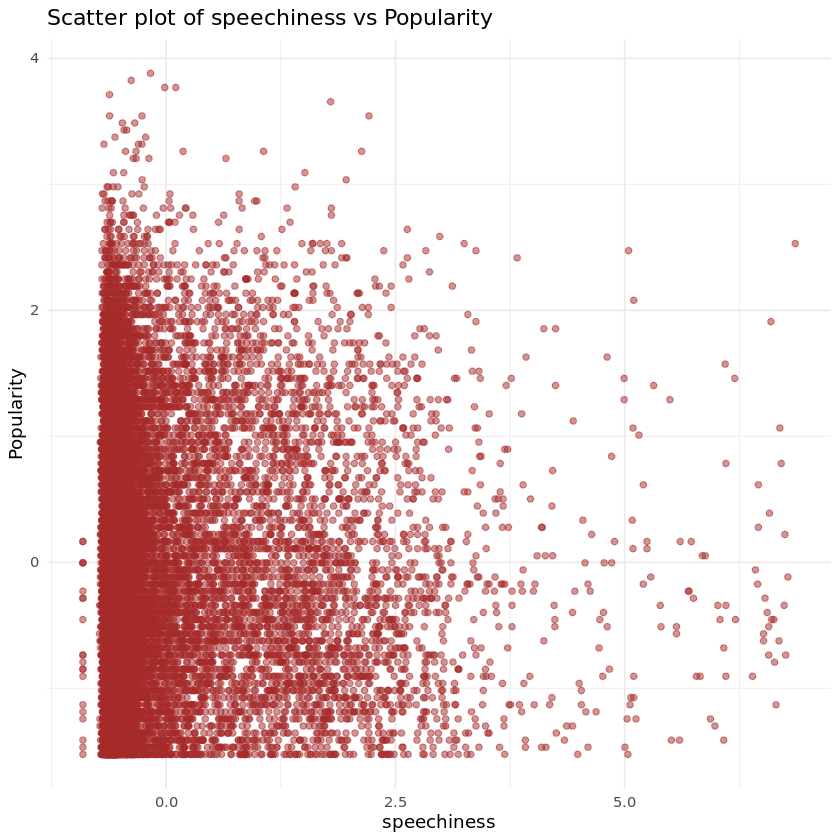

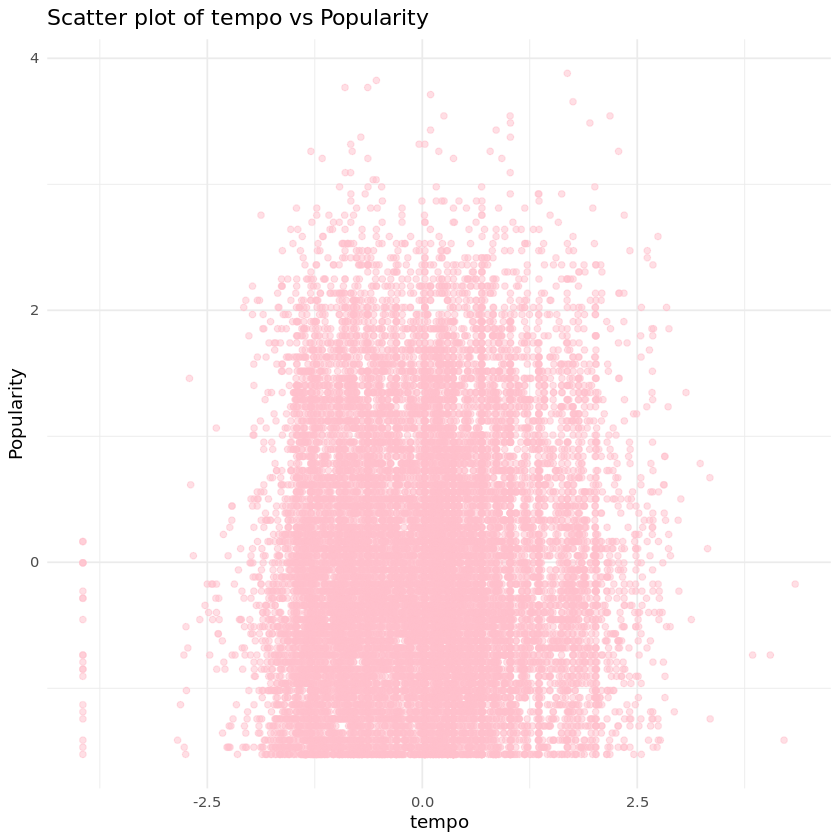

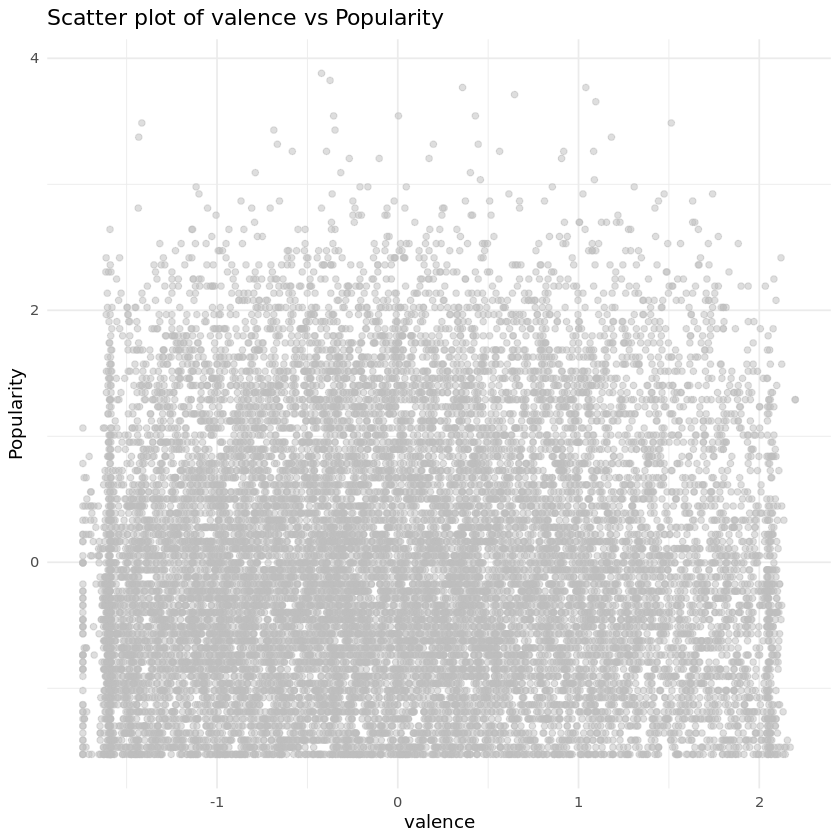

In [15]:
#1- Scatter-Plot
library(ggplot2)
continuous_vars <- c("acousticness", "danceability", "duration_ms", "energy", "instrumentalness", "liveness", "loudness", "speechiness", "tempo", "valence")

# Create a color vector
colors <- c("red", "blue", "green", "purple", "magenta", "cyan", "yellow", "brown", "pink", "gray", "black")

# Iterate through the continuous_vars and colors vectors
for (i in seq_along(continuous_vars)) {
  var <- continuous_vars[i]
  color <- colors[i]
  plot <- ggplot(df_scaled_std, aes_string(x = var, y = "popularity")) +
    geom_point(color = color, alpha = 0.5) +
    labs(title = paste("Scatter plot of", var, "vs Popularity"), x = var, y = "Popularity") +
    theme_minimal()
  print(plot)
}

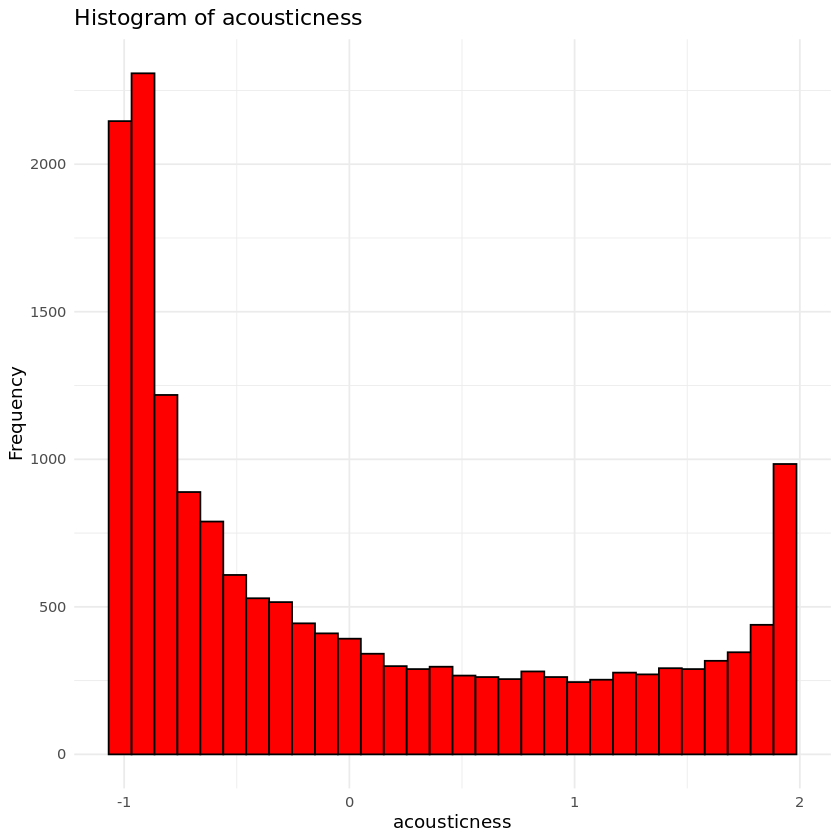

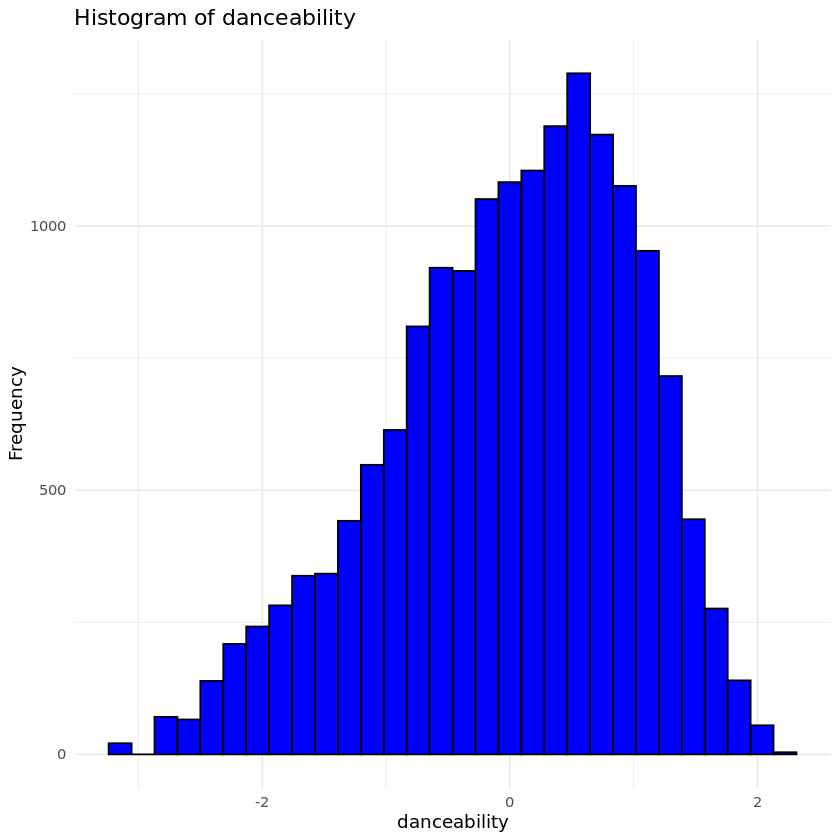

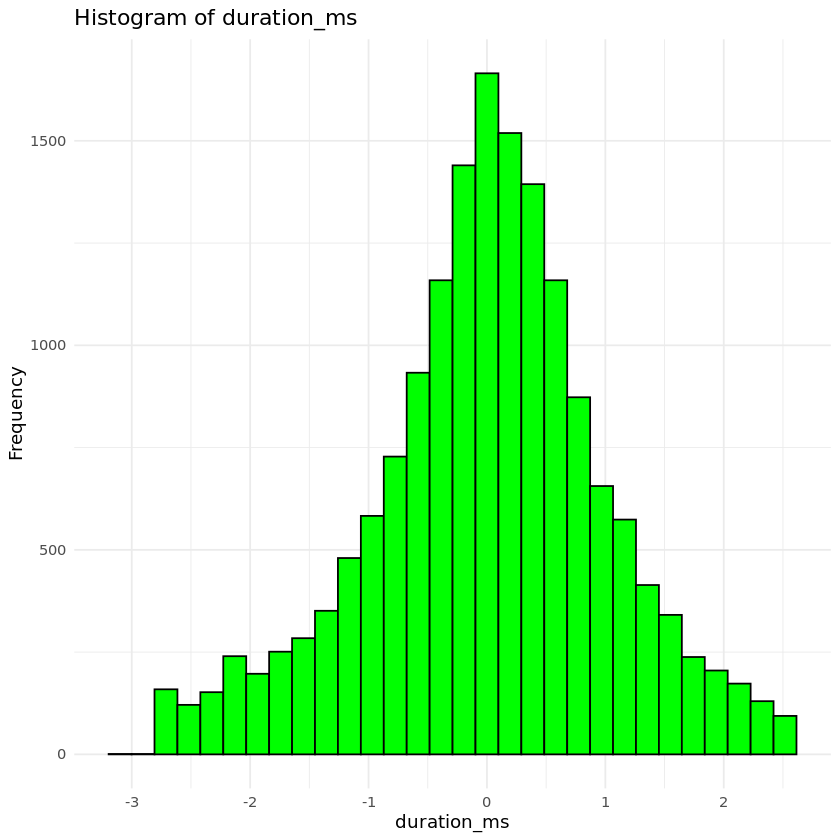

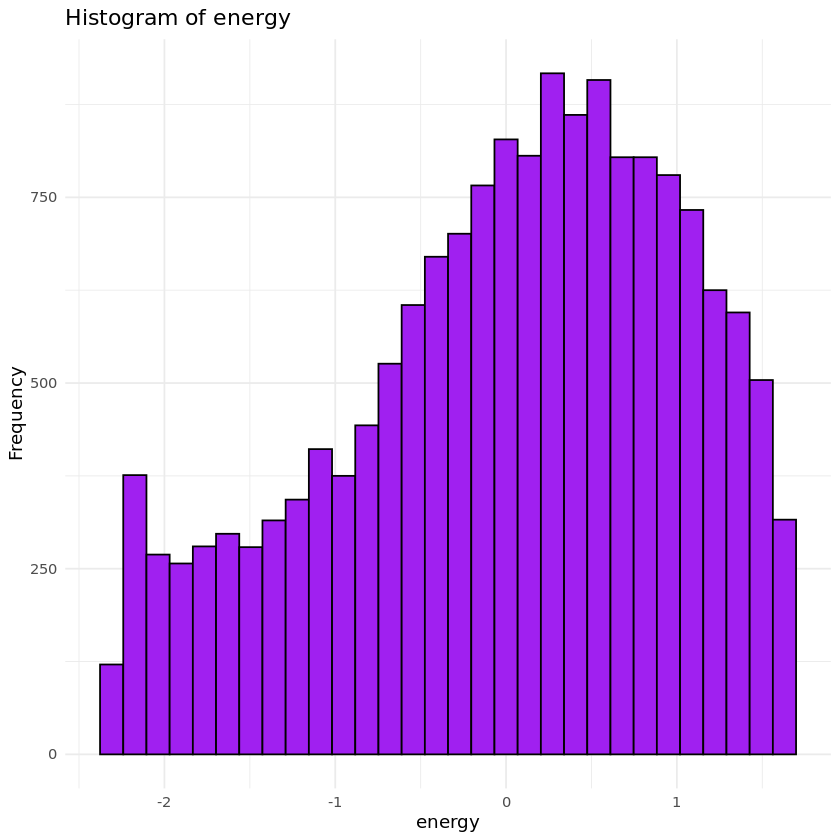

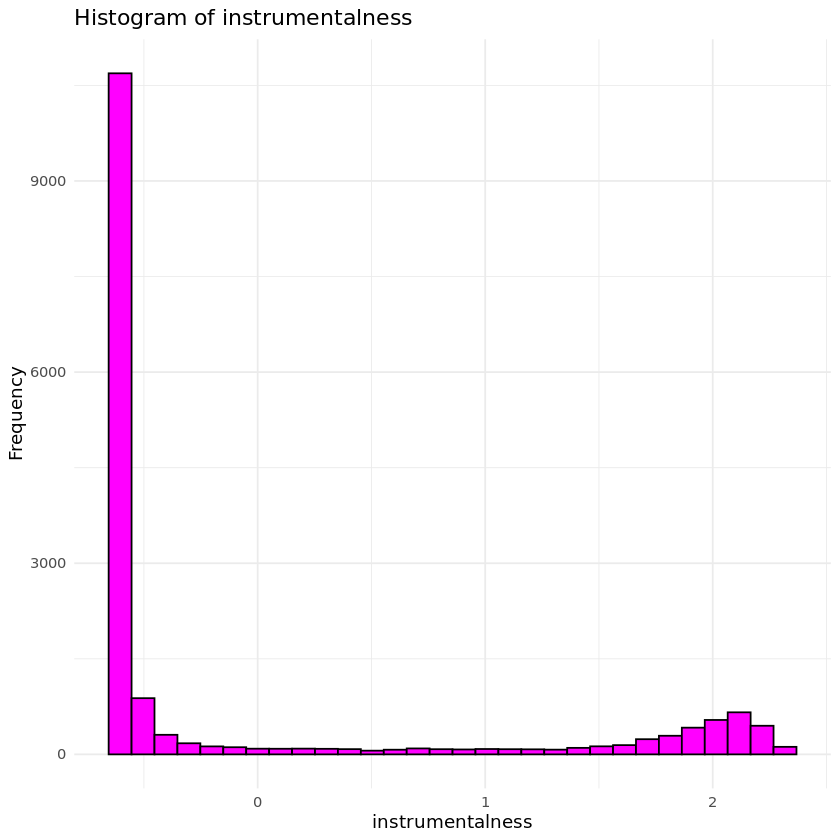

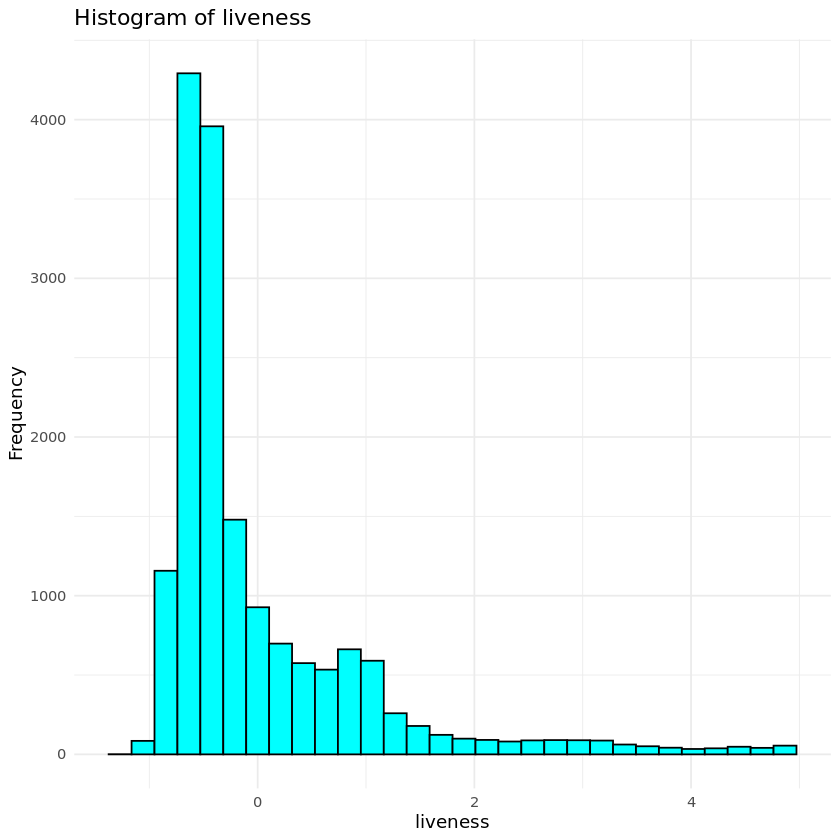

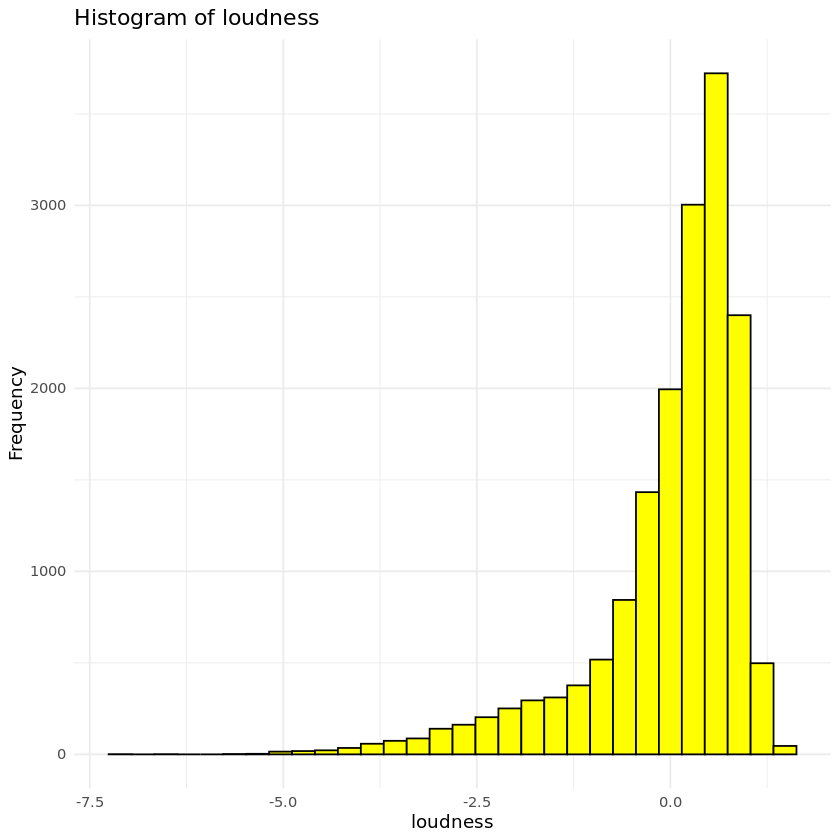

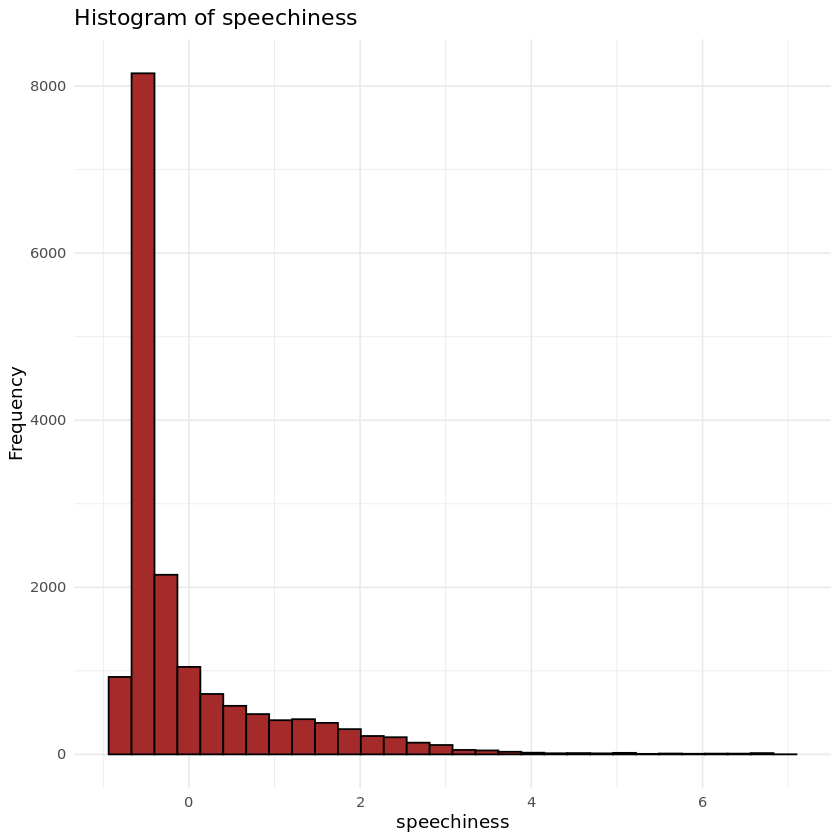

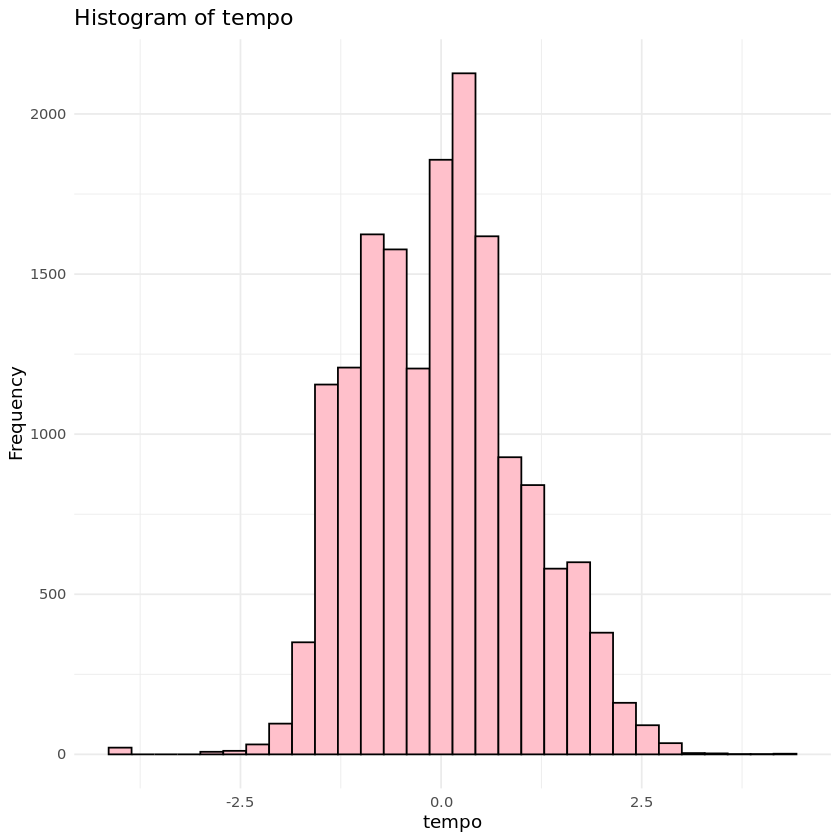

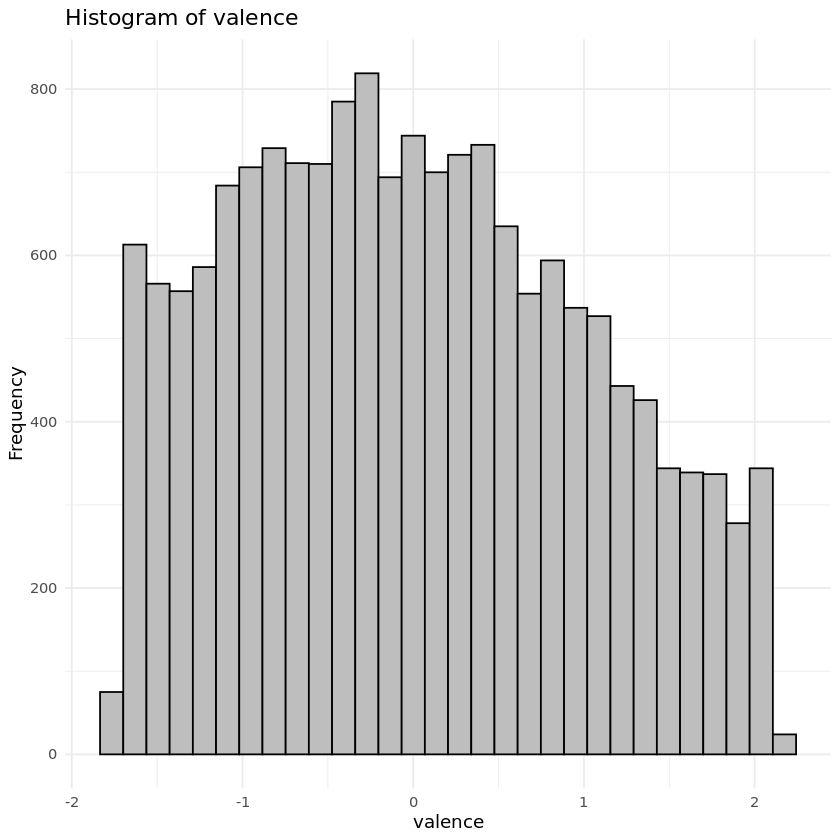

In [14]:
library(ggplot2)
continuous_vars <- c("acousticness", "danceability", "duration_ms", "energy", "instrumentalness", "liveness", "loudness", "speechiness", "tempo", "valence")

# Create a fill color vector
fill_colors <- c("red", "blue", "green", "purple", "magenta", "cyan", "yellow", "brown", "pink", "gray", "black")

# Iterate through the continuous_vars and fill_colors vectors
for (i in seq_along(continuous_vars)) {
  var <- continuous_vars[i]
  fill_color <- fill_colors[i]
  plot <- ggplot(df_scaled_std, aes_string(x = var)) +
    geom_histogram(color = "black", fill = fill_color, bins = 30) +
    labs(title = paste("Histogram of", var), x = var, y = "Frequency") +
    theme_minimal()
  print(plot)
}


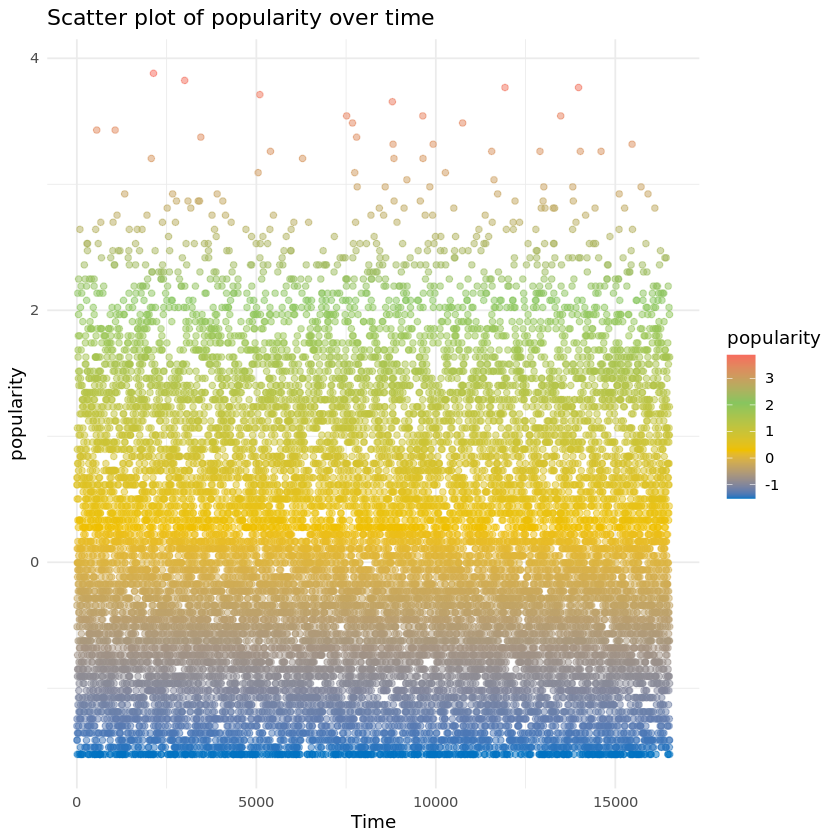

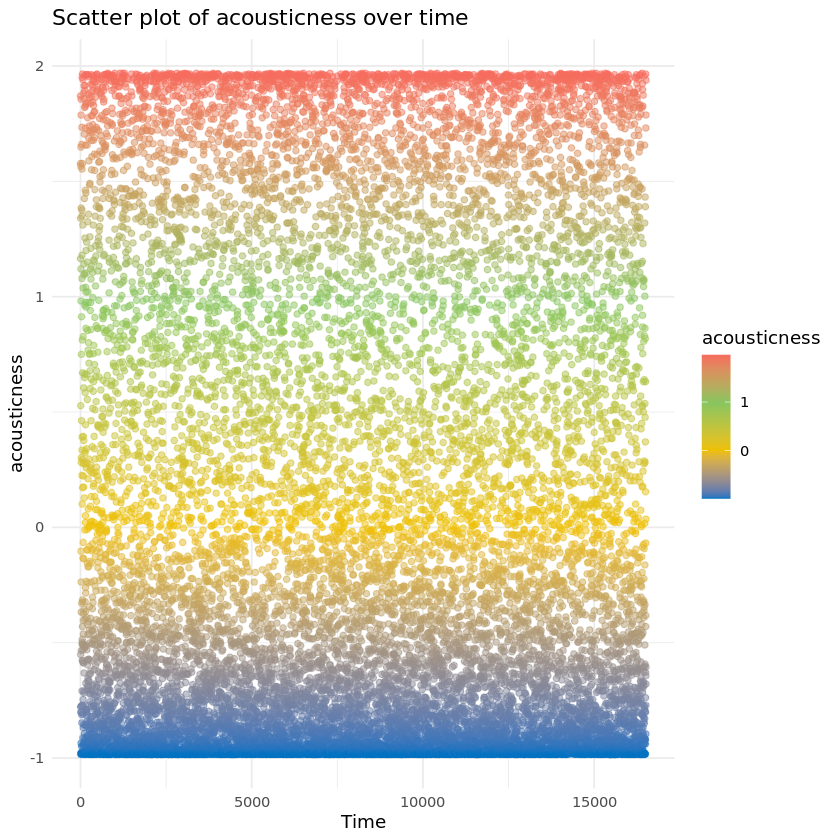

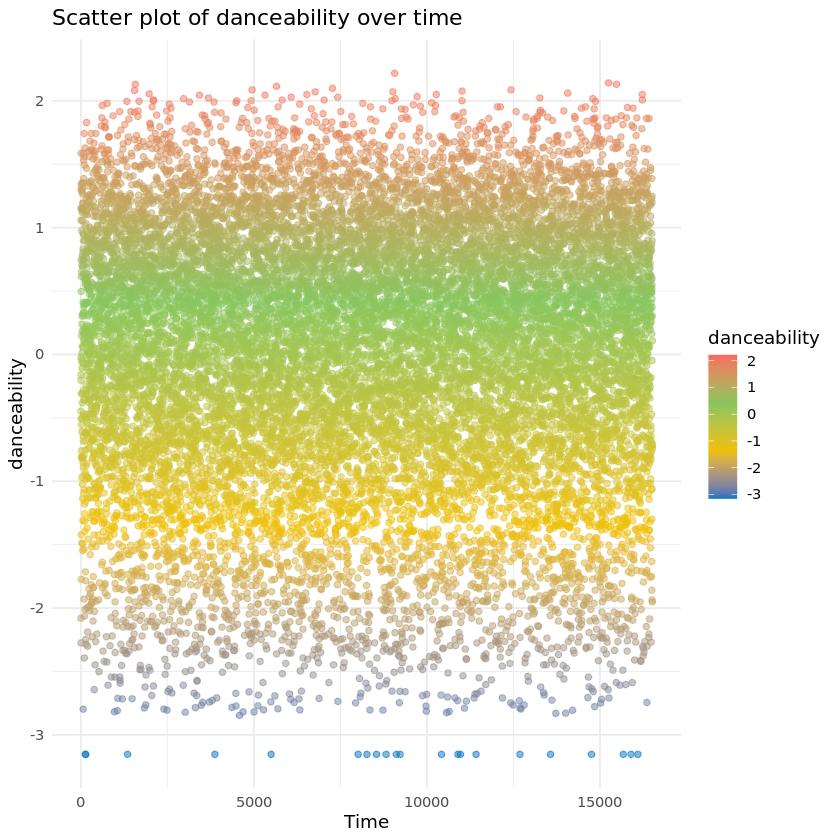

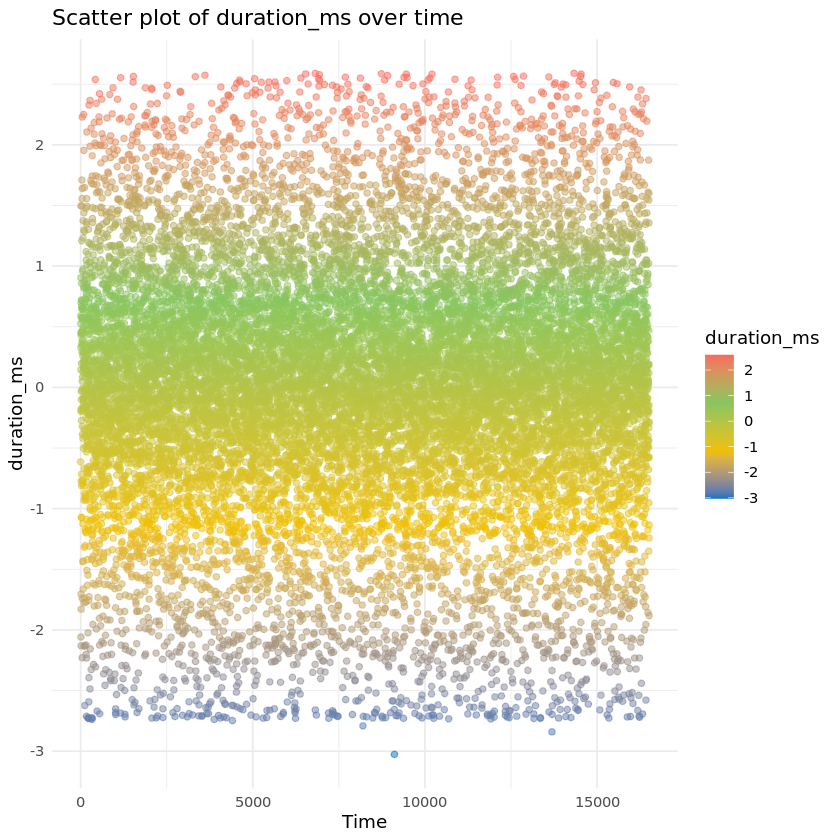

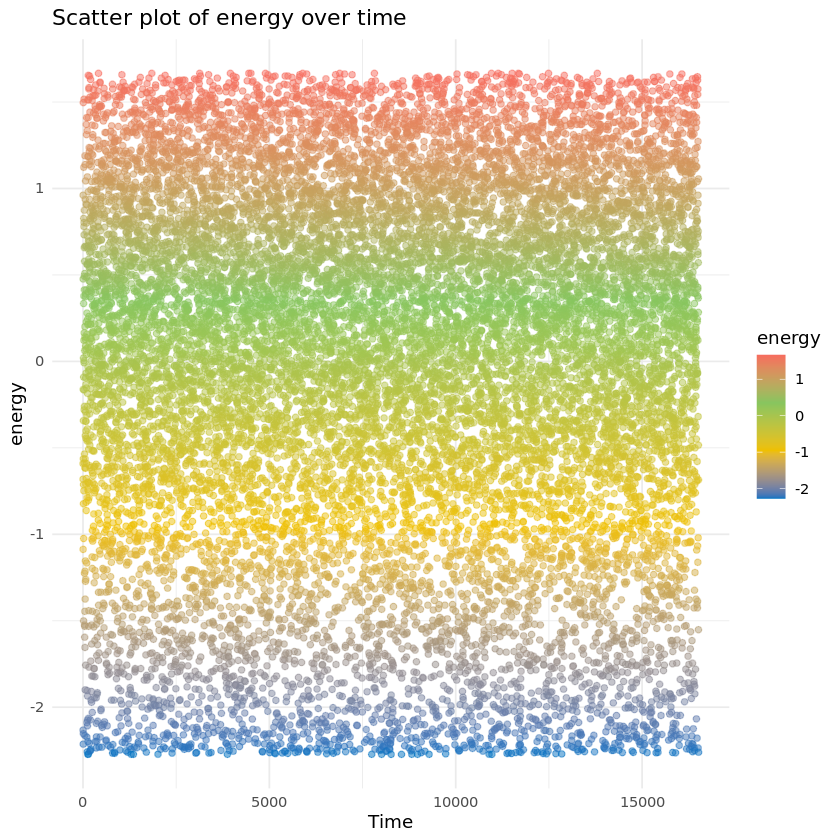

...

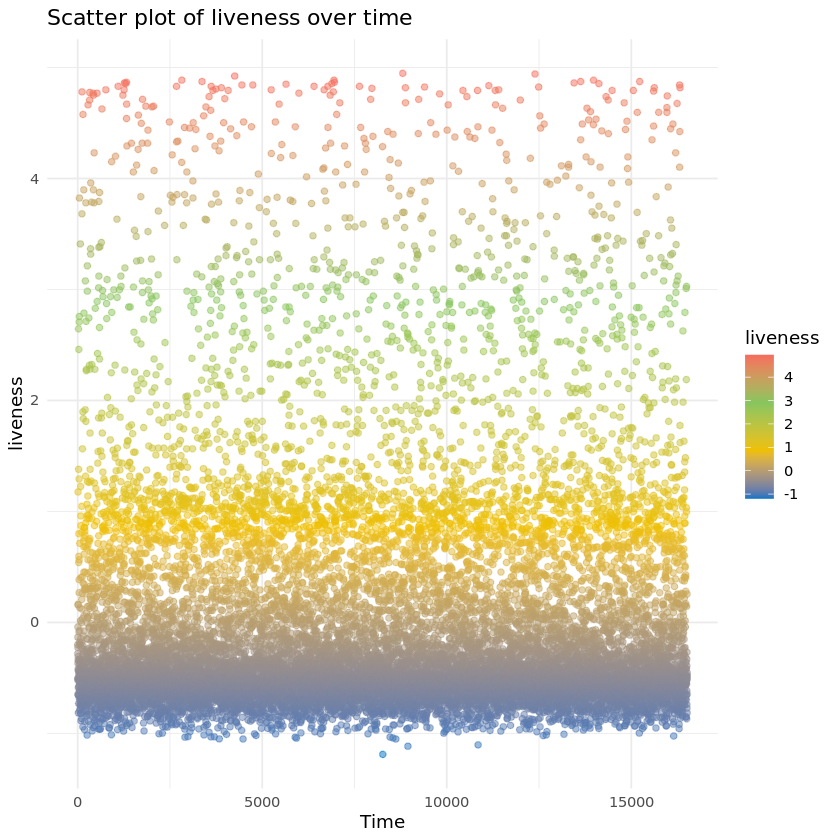

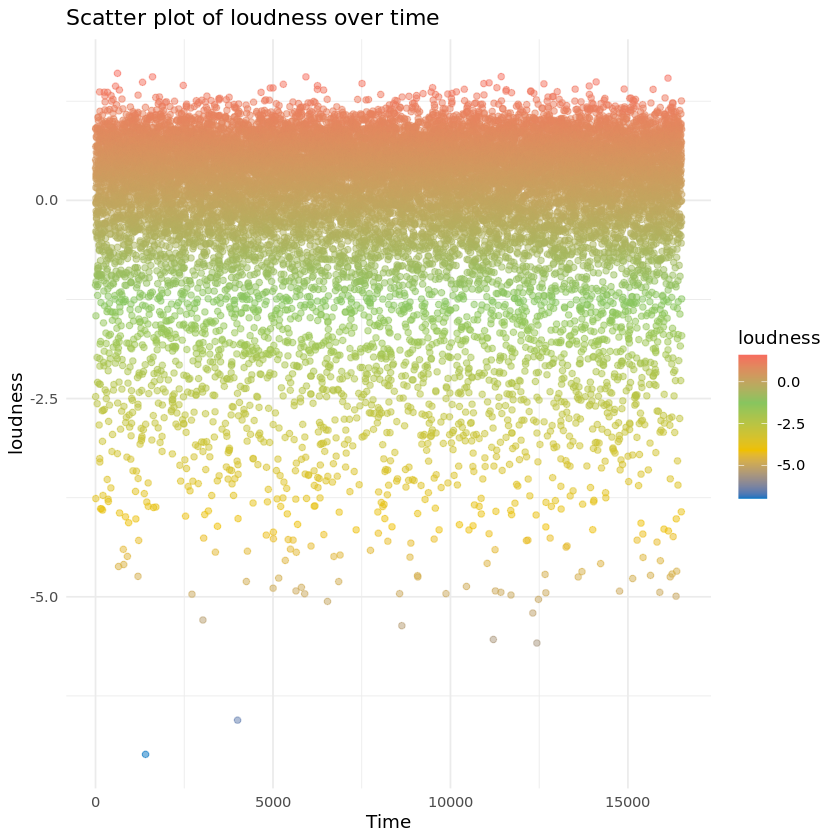

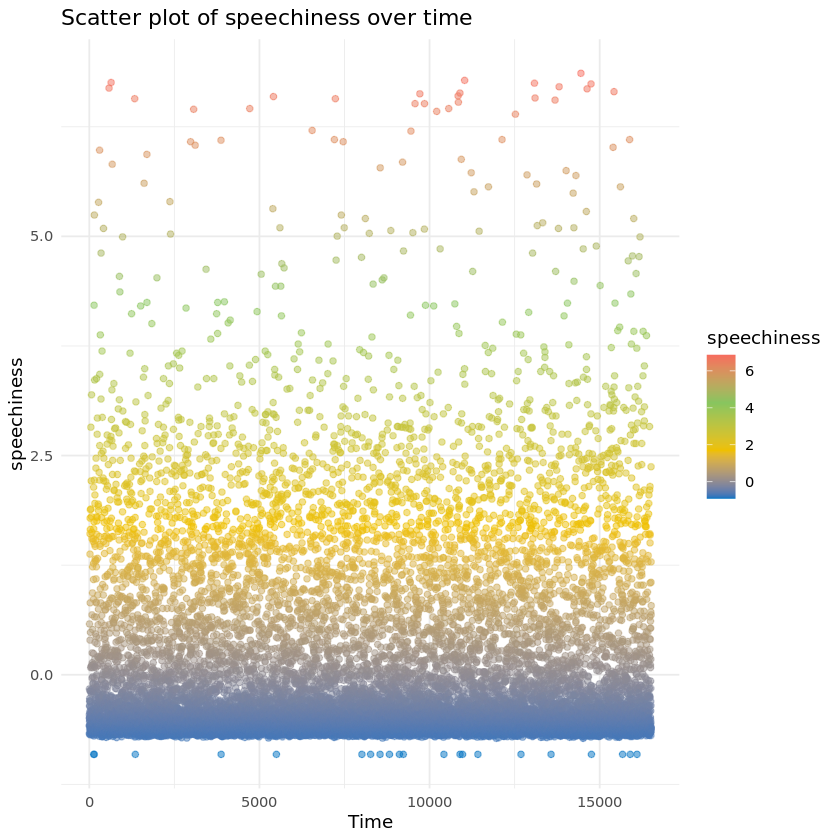

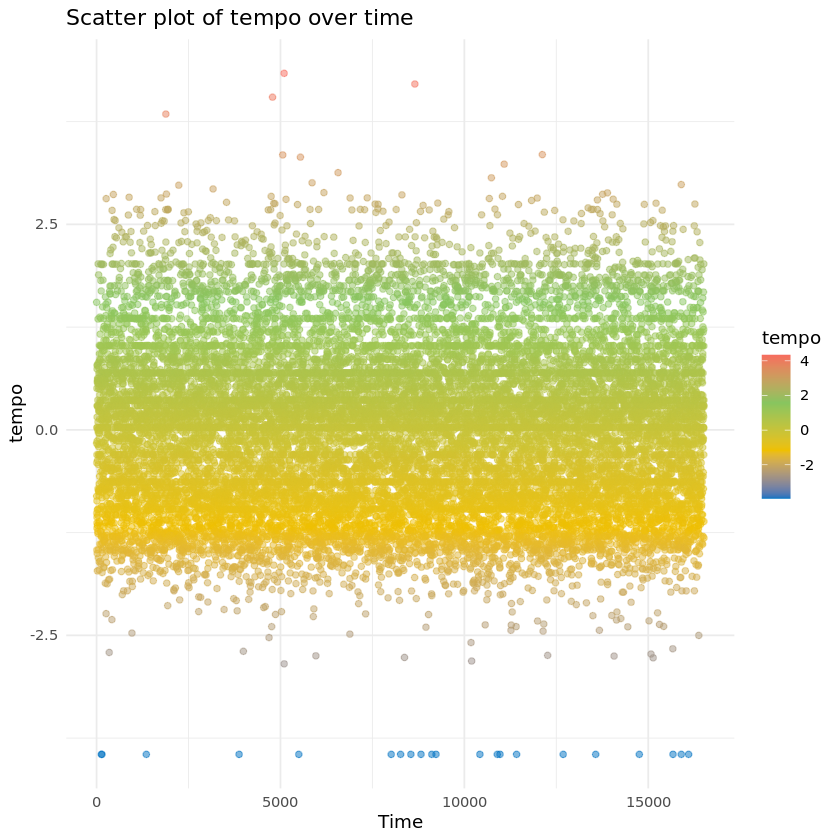

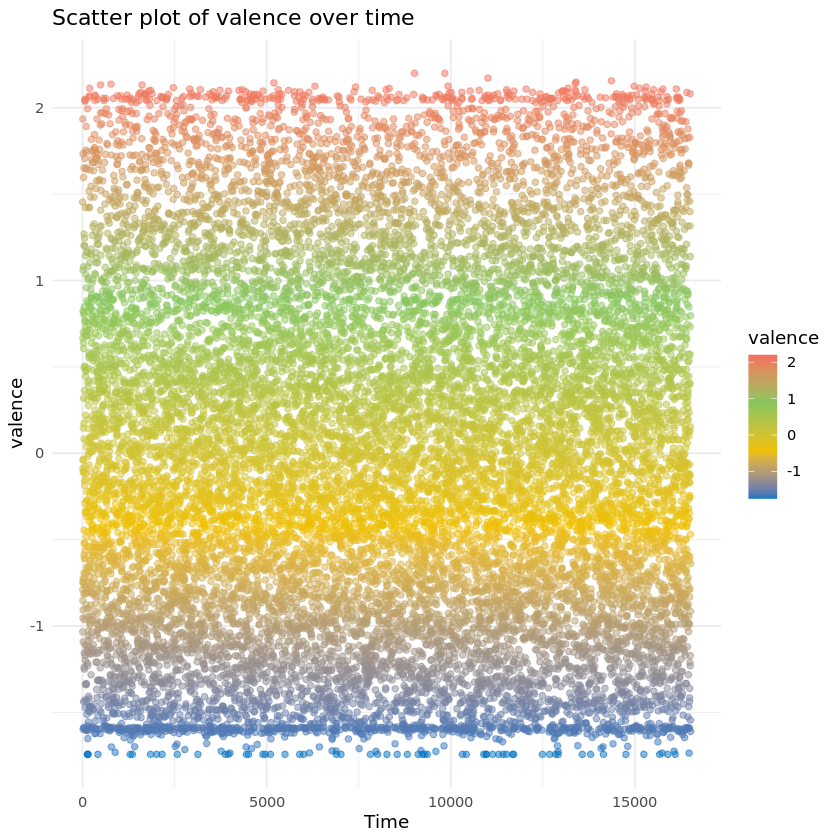

In [13]:
#9
library(ggplot2)
continuous_vars <- c("popularity","acousticness", "danceability", "duration_ms", "energy", "instrumentalness", "liveness", "loudness", "speechiness", "tempo", "valence")

color_palette <- c("#0073C2FF", "#EFC000FF", "#87C55FFF", "#F76C5EFF")

df_scaled_std$order_var <- 1:nrow(df_scaled_std)

for (var in continuous_vars) {
  plot <- ggplot(df_scaled_std, aes_string(x = "order_var", y = var, color = var)) +
    geom_point(alpha = 0.5) +
    scale_color_gradientn(colors = color_palette) +
    labs(title = paste("Scatter plot of", var, "over time"), x = "Time", y = var) +
    theme_minimal()
  print(plot)
}